# Precluster

## Import packages

In [1]:
import scanpy as sc
import os,sys
os.environ["TBB_DISABLE_FAST_PATH"] = "1"
import pandas as pd
import matplotlib.pylab as plt
%matplotlib inline
# from IPython.display import display, Markdown, Latex
import anndata
from ALLCools.plot import categorical_scatter
from pym3c.adata import MultiAdata,subset,generate_hic_adata
import warnings
warnings.filterwarnings("ignore")
# sc.settings.set_figure_params(dpi=80)
import matplotlib as mpl
mpl.style.use('default')
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42
mpl.rcParams['font.family'] = 'sans-serif'
mpl.rcParams['font.sans-serif'] = 'Arial'

In [2]:
# parameter
mcds_path = "~/Projects/BICAN/mcds/*100kb.mcds"
black_list_path = "~/Ref/hg38/annotations/hg38-blacklist.v2.bed.gz"
rootdir="~/Projects/mouse_pfc/clustering/100kb"
metadata_path="~/Projects/mouse_pfc/metadata/metadata.filtered.tsv.gz"
adata_path = "*100kb*.h5ad"
mc_types=['CGN','CHN']
exclude_adata = None
gene_adata_path="*Gene*.h5ad"
exclude_gene_adata=None
# hic
hic_embedding_dir=None
hic_cell_table_path=None

impute=True
normalize_per_cell=True
clip_norm_value=10
max_value=None
with_mean=False
pca_downsample=100000
use_lsi=False
n_cell=0.005
zscore_abs_cutoff=2
batch_col = ['Study','tech'] # major batch effect
batch_correct_method='scvi' #scvi, seurat, scanorama, harmony
categorical_covariate_keys=None
continuous_covariate_keys=None
n_latent=30
n_layers=2
gene_likelihood='nb'
n_jobs=8
std_cutoff = 0.01
non_missing_frac = 0.5 #only keep features with at least 50% non-missing values

level=1
run_subset=False
parent_ct=None
obs_cols=['Region',"mCGFrac","mCHFrac","leiden"]
leiden_resolution1 = 0.25

# CEF
cef_downsample = 500
top_n_enriched_features=200
feature_type='CEF'
alpha=0.05
max_cell_prop = 0.1
p_cutoff=0.1

palette_path = None
clustering_name_annot="CellClass"

In [3]:
# Parameters
level = 1
parent_ct = "Astrocyte"
obs_cols = ["Region", "donor", "tech", "mCGFrac", "mCHFrac", "leiden"]
rootdir = "/home/x-wding2/Projects/BG/clustering/ASC_clustering"
metadata_path = "/home/x-wding2/Projects/BG/clustering/100kb/L2/data/Astrocyte.metadata.txt"
mc_types = ["CGN",'CHN']
pca_downsample = False
use_lsi = False
normalize_per_cell = True
clip_norm_value = 10
max_value = None
with_mean = False
batch_col = ["Study", 'tech',"donor"]
batch_correct_method = "harmony"
categorical_covariate_keys = None
n_layers = 1
std_cutoff = None
adata_path = ["~/Projects/BG/adata/BG.100kb-CGN.h5ad", 
              "~/Projects/BG/adata/BG.100kb-CHN.h5ad", 
              # "~/Projects/BG/adata/BG.100kb-HiC.h5ad"
             ]
exclude_adata = None
gene_adata_path = "/home/x-wding2/Projects/BG/adata/BG.gene-C*N.h5ad"
exclude_gene_adata = None
# hic_embedding_dir = "/home/x-wding2/Projects/BG/HIC/100K_embedding/raw"
# hic_cell_table_path = "/home/x-wding2/Projects/BG/HIC/impute/100K_cell_table.tsv"
cef_downsample = 500
top_n_enriched_features = 100
feature_type = "CEF"
alpha = 0.05
max_cell_prop = None
p_cutoff = 0.1
coord_base = "umap"
use_rep = "X_pca_harmony"
n_neighbors = None
metric = "euclidean"
min_cluster_size = 50
leiden_repeats = 200
leiden_resolution1 = 0.5
leiden_resolution2 = 0.5
consensus_rate = 0.5
train_frac = 0.5
train_max_n = 1000
random_state = 0
max_iter = 50
n_jobs = 16
target_accuracy = 0.95
cor_method = "pearson"
linkage_method = "average"
marker_path = "/home/x-wding2/Projects/BG/metadata/BG_markers.xlsx"
marker_sheet = "BG"
marker_level = None
max_depth = None
palette_path = "/home/x-wding2/Projects/BG/metadata/BG_color_palette.xlsx"
clustering_name_annot = "Group"
final_mc_read_col = "UniqueAlignFinalReads"
score_key = "BG.gene-CGN"
param_yaml = "/home/x-wding2/Projects/Github/pym3c/pym3c/notebooks/clustering/ASC_clustering.yaml"
kernel_name = "m3c"
species = "human"

In [4]:
rootdir=os.path.abspath(os.path.expanduser(rootdir))
clustering_name=f"L{level}"
outdir=os.path.join(rootdir,clustering_name)
outdir=os.path.abspath(os.path.expanduser(outdir))
figdir=os.path.join(outdir,"figures")
datadir=os.path.join(outdir,"data")
if not os.path.exists(figdir):
    os.makedirs(figdir,exist_ok=True)
if not os.path.exists(datadir):
    os.makedirs(datadir,exist_ok=True)

if parent_ct is None:
    data_basename=os.path.join(datadir,f"{clustering_name}")
    fig_basename=os.path.join(figdir,f"{clustering_name}")
else:
    bname=f"{clustering_name}_{parent_ct}"
    data_basename=os.path.join(datadir,bname.replace(' ','_'))
    fig_basename=os.path.join(figdir,bname.replace(' ','_'))

print(metadata_path)

/home/x-wding2/Projects/BG/clustering/100kb/L2/data/Astrocyte.metadata.txt


## Read madata

In [5]:
madata=MultiAdata(
    adata_path=adata_path,exclude=exclude_adata,
    metadata_path=metadata_path,read=False)
# generate region adata for level > 1 to get new feature which can be used to distinguish higher resolution subtypes.
adata_path=[]
for input_adata_path in madata.adata_files:
    output_adata_path=data_basename+"."+os.path.basename(input_adata_path)
    bnames=os.path.basename(input_adata_path).replace('.h5ad','').split('-')
    mc_type=bnames[1]
    # batch_col1=None if bnames[0].split('.')[-1]=='5kb' else batch_col
    normalize_per_cell1=False if bnames[0].split('.')[-1]=='5kb' else normalize_per_cell
    print(input_adata_path,mc_type,normalize_per_cell1)
    if mc_type in mc_types:
        if not os.path.exists(output_adata_path):
            print(input_adata_path,output_adata_path)
            subset(
                    input_adata_path, output=output_adata_path,
                    run_embedding=True, batch_col=batch_col,
                    downsample=pca_downsample, use_lsi=use_lsi,
                    std_cutoff=std_cutoff,cell_meta=metadata_path,
                    non_missing_frac=non_missing_frac,impute=impute,
                    normalize_per_cell=normalize_per_cell1,n_jobs=n_jobs,
                    n_cell=n_cell,zscore_abs_cutoff=zscore_abs_cutoff,
                    resolution=leiden_resolution1,p_cutoff=p_cutoff)
        # normalization (by cell) and log_scaled will be performed to calculate the embedding, but the final X will be raw fraction
    elif mc_type=='HiC' or mc_type.lower()=='hic':
        # add Hi-C embedding adata
        if hic_embedding_dir is None or hic_cell_table_path is None:
            continue
        if os.path.exists(input_adata_path) and level==1 and not run_subset: #the first round, read existed adata
            print(f"Reading HiC adata from {input_adata_path}")
            adata=anndata.read_h5ad(input_adata_path)
        else:
            if level > 1 or run_subset:
                output=data_basename+"."+os.path.basename(input_adata_path)
            else:
                output=input_adata_path
            if not os.path.exists(output):
                output_adata_path=generate_hic_adata(
                        input_dir=hic_embedding_dir,cell_meta=metadata_path,
                        cell_table_path=hic_cell_table_path,key_added='X_pca',
                        output=output,impute=False,normalize_per_cell=False,
                        n_jobs=n_jobs,resolution=leiden_resolution1,p_cutoff=p_cutoff)
    else:
        continue
    adata_path.append(output_adata_path)
print(adata_path)

/home/x-wding2/Projects/BG/adata/BG.100kb-CGN.h5ad CGN True
/home/x-wding2/Projects/BG/adata/BG.100kb-CHN.h5ad CHN True
['/home/x-wding2/Projects/BG/clustering/ASC_clustering/L1/data/L1_Astrocyte.BG.100kb-CGN.h5ad', '/home/x-wding2/Projects/BG/clustering/ASC_clustering/L1/data/L1_Astrocyte.BG.100kb-CHN.h5ad']


In [6]:
madata=MultiAdata(
        adata_path=adata_path,exclude=exclude_adata,
        metadata_path=metadata_path)

L1_Astrocyte.BG.100kb-CGN adata.shape: (8829, 26787) PCA shape: (8829, 38)


L1_Astrocyte.BG.100kb-CHN adata.shape: (8829, 26787) PCA shape: (8829, 68)


n_obs: 8829


tsne
L1_Astrocyte.BG.100kb-CGN


L1_Astrocyte.BG.100kb-CHN


umap
L1_Astrocyte.BG.100kb-CGN


L1_Astrocyte.BG.100kb-CHN


<Figure size 640x480 with 0 Axes>

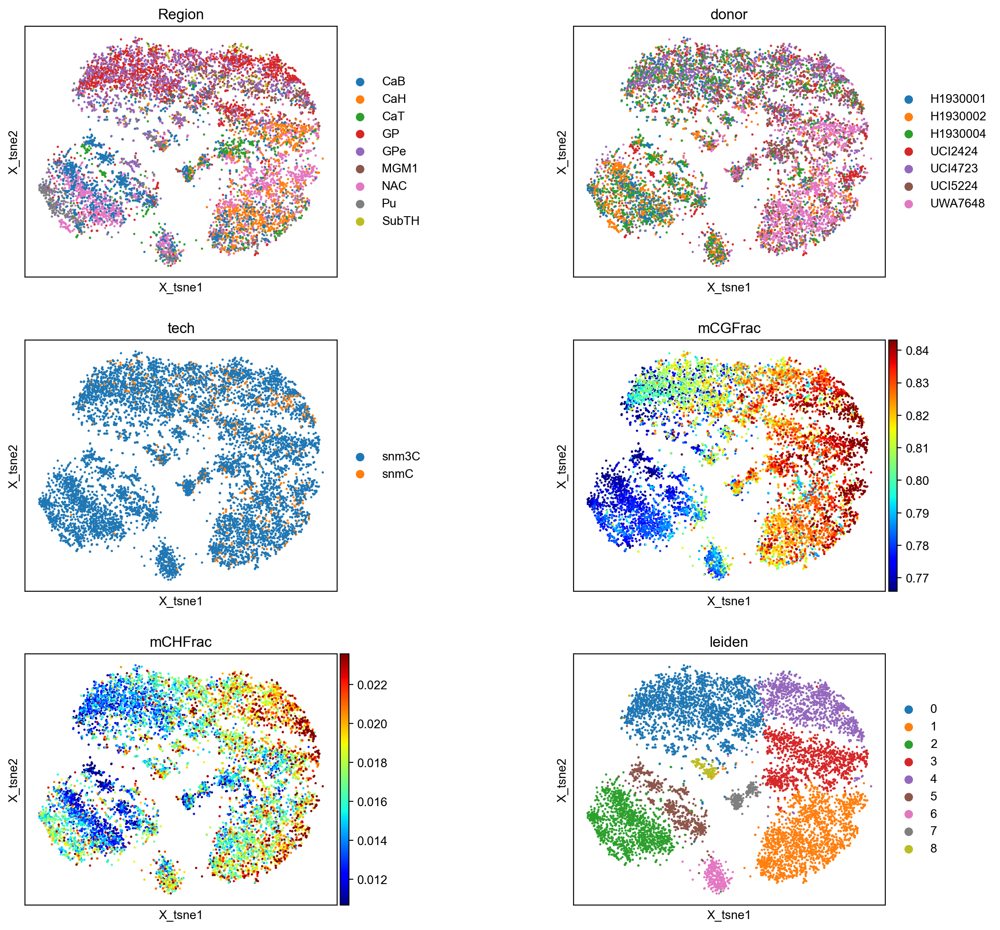

<Figure size 640x480 with 0 Axes>

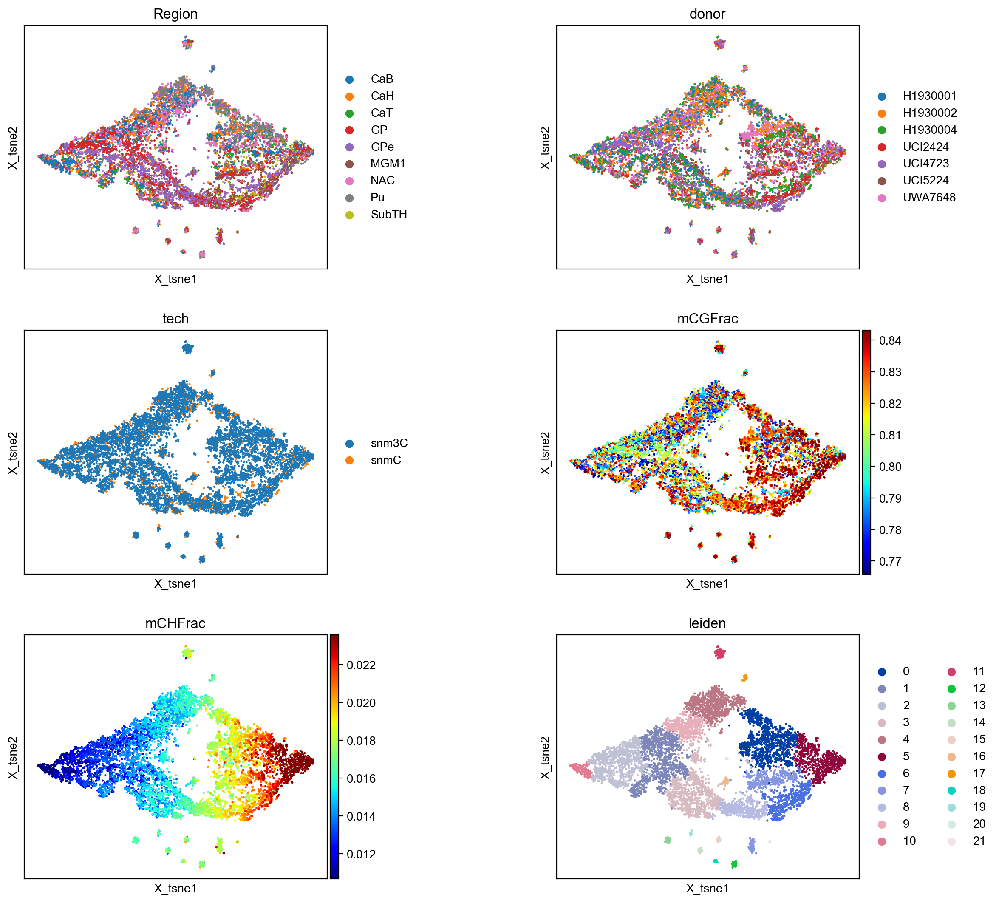

<Figure size 640x480 with 0 Axes>

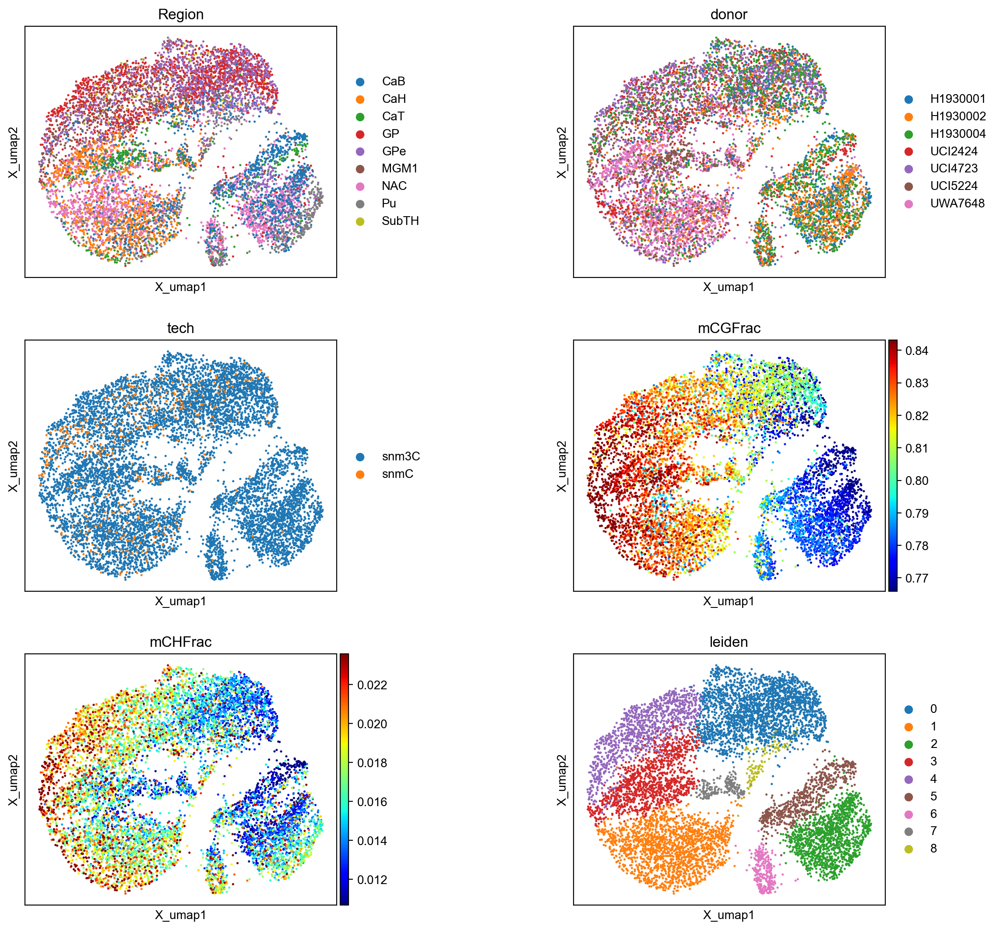

<Figure size 640x480 with 0 Axes>

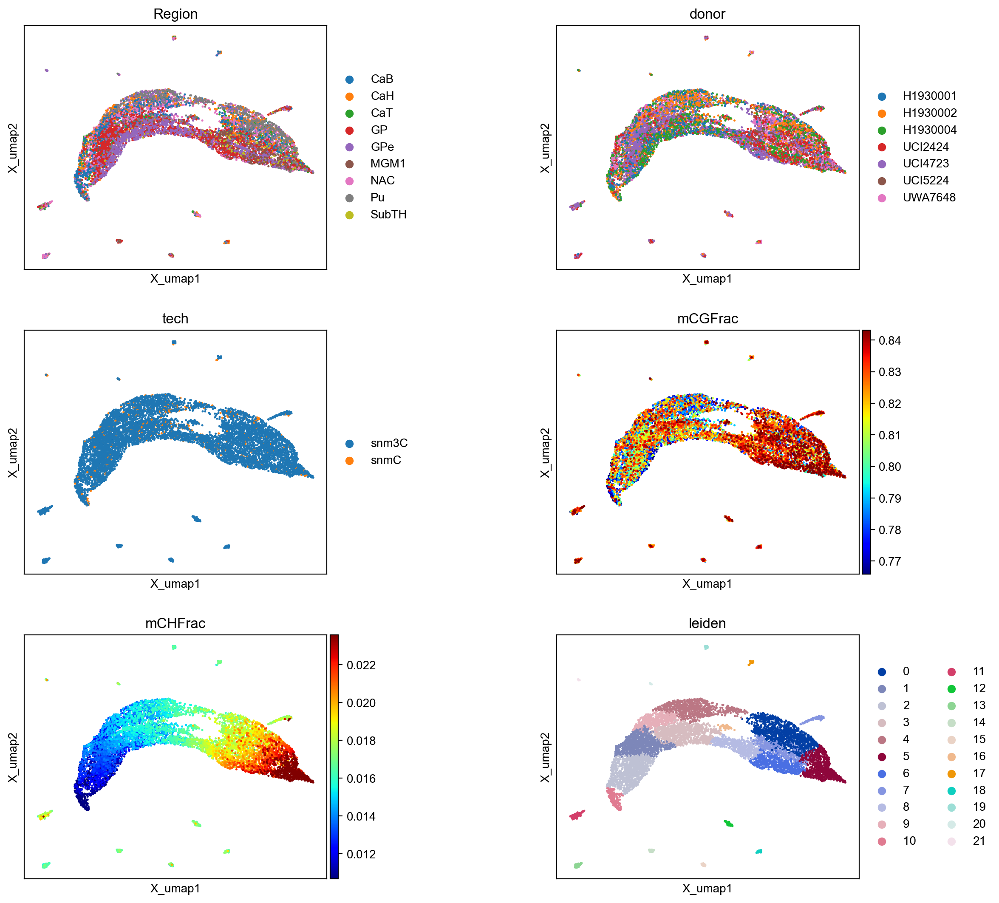

In [7]:
for embedding in ['tsne','umap']: #tsne_raw is tsne without batch correction (harmony)
    print(embedding)
    for key in madata.get_keys():
        if f"X_{embedding}" not in madata.madata[key].obsm:
            continue
        plt.figure()
        madata.plot(keys=[key],coord_base=embedding,obs_cols=obs_cols,wspace=0.6,ncols=2,cmap='jet',legend_loc='right margin')
        plt.savefig(f"{fig_basename}.{key}.summary.{embedding}.pdf",bbox_inches='tight',dpi=300)

## CEF (Cluster Enriched Features)

L1_Astrocyte.BG.100kb-CGN


Normalizing cell level fraction by alpha and beta (prior_mean)


Found 9 clusters to compute feature enrichment score
Computing enrichment score


Computing enrichment score FDR-corrected P values


Selected 774 unique features
Using Cluster Enriched Features


Normalizing cell level fraction by alpha and beta (prior_mean)
(8829, 774)
adding raw to adata of L1_Astrocyte.BG.100kb-CGN ..


2025-07-12 21:56:27.534 | INFO     | pym3c.adata:cef:1322 - Running sc.tl.pca..


min and max: 0.107263856 33.09778


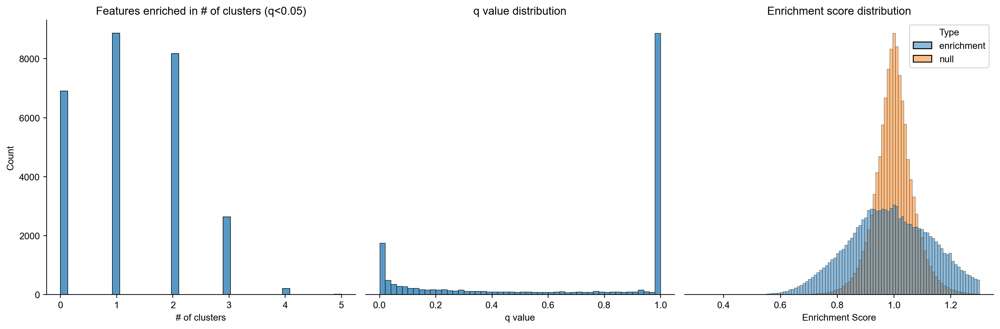

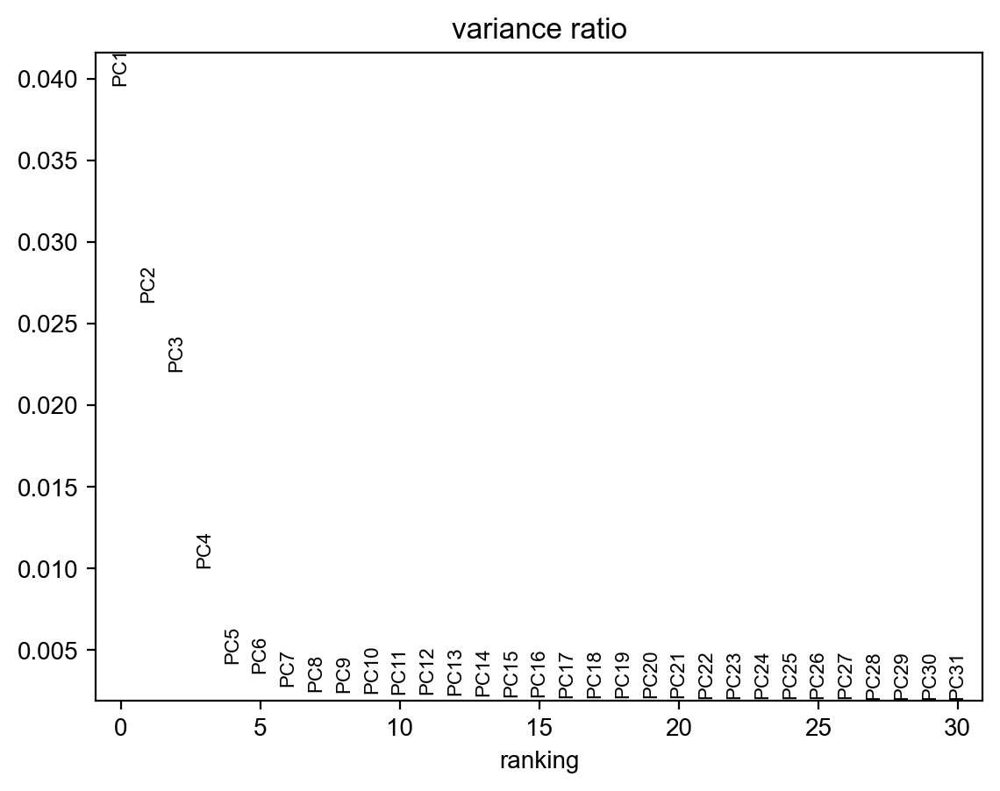

9 components passed P cutoff of 0.1.
Changing adata.obsm[X_pca] from shape (8829, 100) to (8829, 9)
L1_Astrocyte.BG.100kb-CHN


Normalizing cell level fraction by alpha and beta (prior_mean)


Found 22 clusters to compute feature enrichment score
Computing enrichment score


Computing enrichment score FDR-corrected P values


Selected 1449 unique features
Using Cluster Enriched Features


Normalizing cell level fraction by alpha and beta (prior_mean)


2025-07-12 21:59:11.526 | INFO     | pym3c.adata:cef:1322 - Running sc.tl.pca..


(8829, 1449)
adding raw to adata of L1_Astrocyte.BG.100kb-CHN ..
min and max: 0.01521881 12.97666


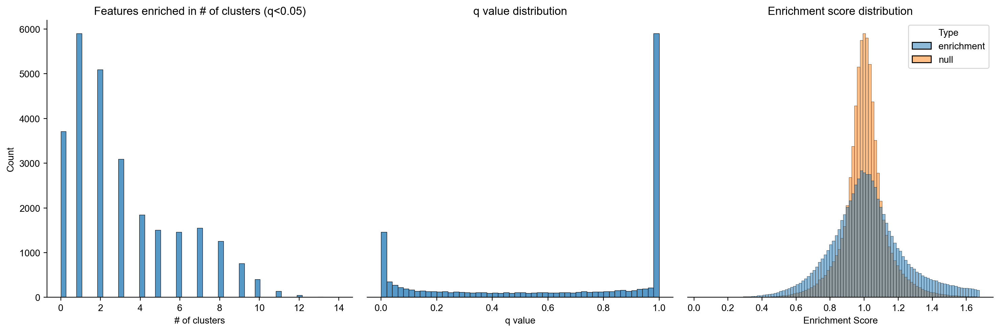

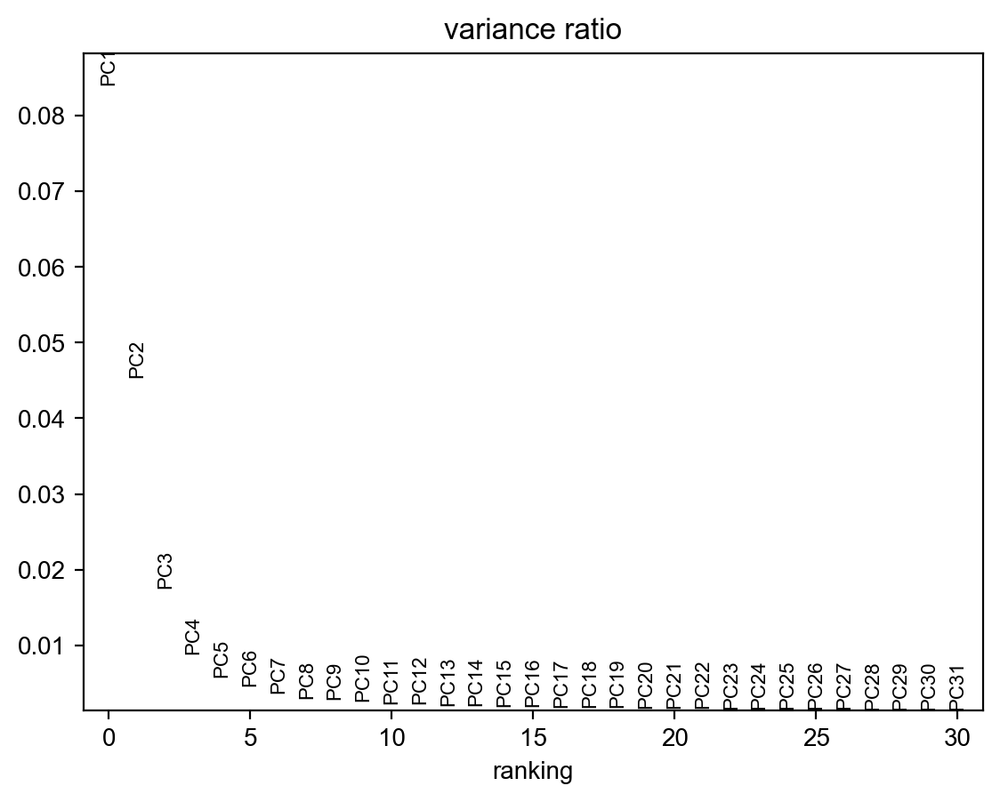

20 components passed P cutoff of 0.1.
Changing adata.obsm[X_pca] from shape (8829, 100) to (8829, 20)


In [8]:
# CEF
if feature_type == 'CEF':
    madata.cef(cef_downsample=cef_downsample,
               top_n_enriched_features=top_n_enriched_features,
               alpha=alpha,max_cell_prop = max_cell_prop,
               p_cutoff=p_cutoff,outdir=datadir,
               normalize_per_cell=normalize_per_cell,
               clip_norm_value=clip_norm_value,
               max_value=max_value,with_mean=with_mean)

## Before and after batch correction (harmony)

L1_Astrocyte.BG.100kb-CGN


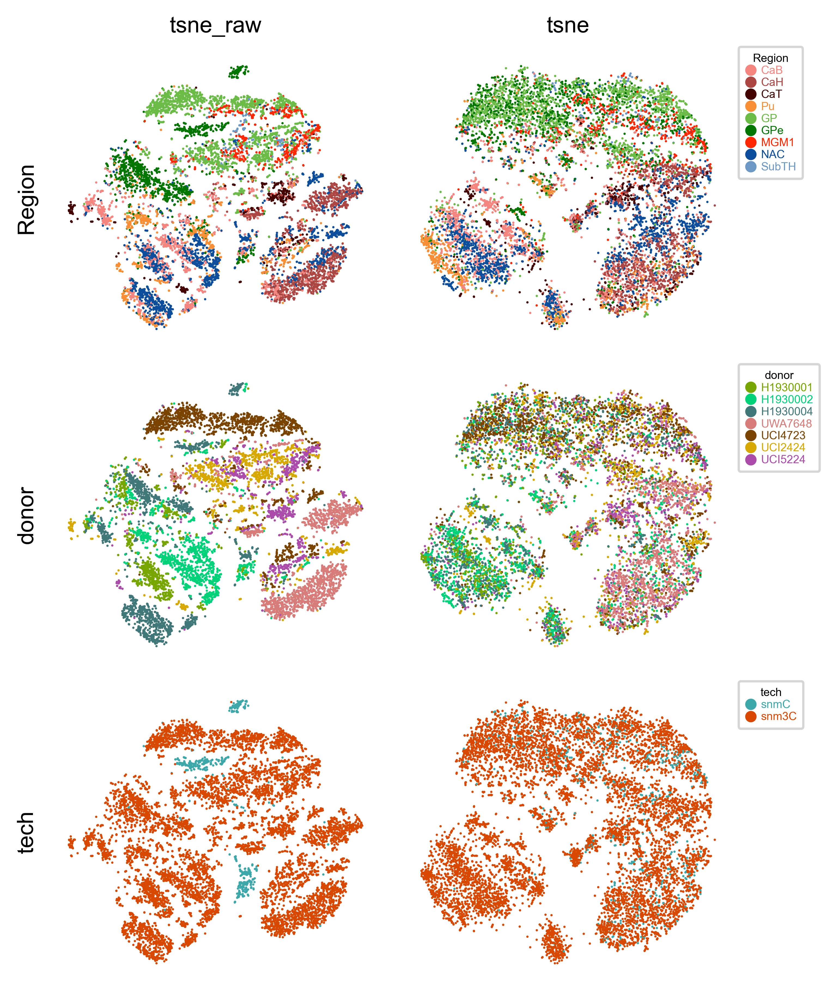

L1_Astrocyte.BG.100kb-CHN


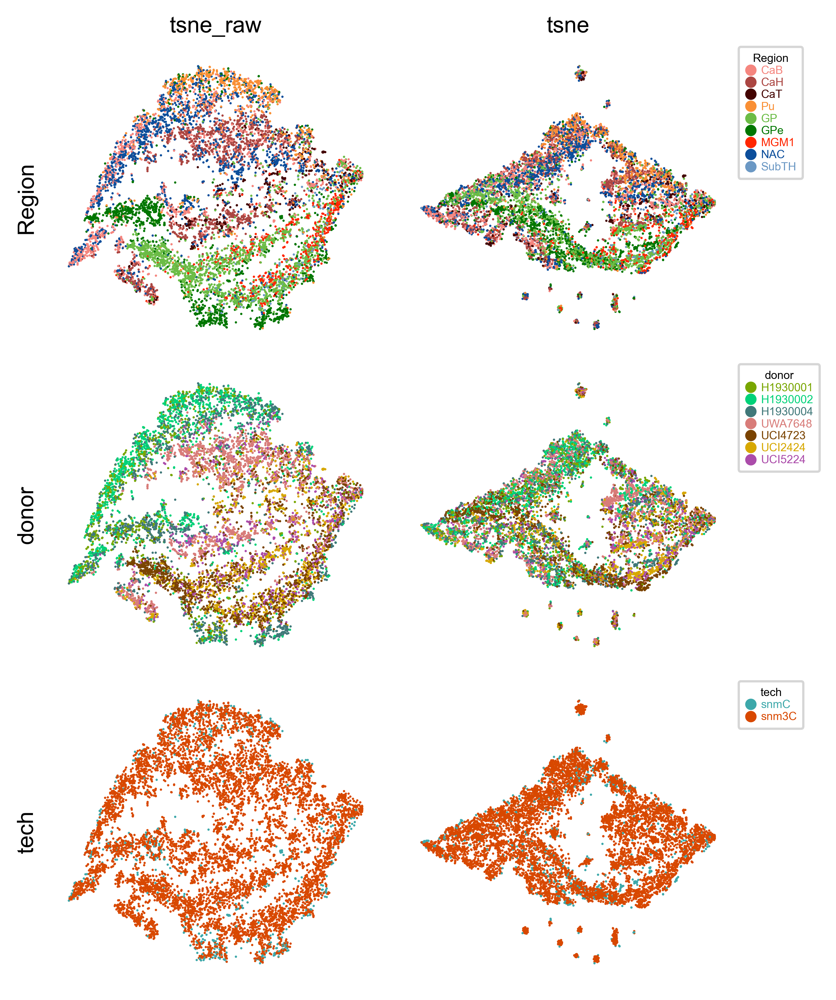

In [9]:
has_tsne_raw=True
for key in madata.get_keys():
        if "X_tsne_raw" not in madata.madata[key].obsm:
            has_tsne_raw=False
keys=list(pd.read_excel(os.path.expanduser(palette_path),sheet_name=None,index_col=0).keys())
selected_cols=[col for col in obs_cols if col in keys] #rows
if not batch_col is None and has_tsne_raw and len(selected_cols)  > 0:
    from pym3c.adata import plot_cluster
    basises=['tsne_raw','tsne'] # columns
    if len(selected_cols) > 0:
        nrows=len(selected_cols)
        ncols=len(basises)
        for key in madata.get_keys():
            print(key)
            adata=madata.madata[key]
            fig, axes = plt.subplots(nrows=nrows, ncols=ncols, 
                                     figsize=(ncols * 2.5, nrows * 2), dpi=300,
                                     constrained_layout=True,gridspec_kw=dict(wspace=-0.05,hspace=-0.05))
            if nrows==1:
                axes=axes.reshape(1,-1)
            for i,col in enumerate(selected_cols):
                if adata.obs[col].dropna().nunique()==0:
                    continue
                for j,basis in enumerate(basises):
                    ax=axes[i,j]
                    show_legend = True if (j + 1) == ncols else False
                    plot_cluster(adata_path=adata,coord_base=basis,cluster_col=col,
                         ax=ax,coding=False,palette_path=palette_path,
                         output=None,show_legend=show_legend,legend_fontsize=5,fontsize=6,
                        text_anno=None,show=False,axis_format=None)
                    if i==0:
                        ax.set_title(basis, fontsize=10)
                    if j==0:
                        ax.set_ylabel(col, fontsize=10)
                    # ax.axis('off')
            plt.tight_layout()
            plt.savefig(f"{fig_basename}.batch_correction.clustering.pdf", dpi=300, bbox_inches='tight')  #
            plt.show()

## Concatenate PCs
We further performed pre-clustering for each top PC set and selected the PCs that are enriched in pre-clusters following Ref (65). Finally, the selected PCs from both CG and CH methylation PCs were concatenated for further analysis. We used Harmony (66) on the selected 
PCs in order to eliminate individual differences. The Harmonized features were further fed into the consensus clustering procedures previously described (1).

In [10]:
adata=madata.run_embedding(
        batch_col=batch_col,
        leiden_resolution=leiden_resolution1,
        normalize_per_cell=normalize_per_cell, 
        clip_norm_value=clip_norm_value,max_value=max_value,
        batch_correct_method=batch_correct_method, #seurat, scanorama, harmony, scvi
        n_jobs=n_jobs,
        categorical_covariate_keys=categorical_covariate_keys,
        continuous_covariate_keys=continuous_covariate_keys,
        n_latent=n_latent, n_layers=n_layers,
        gene_likelihood=gene_likelihood)

2025-07-12 21:59:21.548 | INFO     | pym3c.adata:concat_pca:1365 - Concat pcs..


2025-07-12 21:59:21,656 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


Run clustering
Identified 13 unique batch:  ['BICAN-snm3C-UWA7648', 'BICAN-snm3C-UCI2424', 'HBA-snm3C-H1930002', 'BICAN-snm3C-UCI5224', 'BICAN-snm3C-UCI4723', 'HBA-snm3C-H1930001', 'HBA-snmC-H1930004', 'HBA-snm3C-H1930004', 'HBA-snmC-H1930002', 'BICAN-snm3C-H1930001', 'BICAN-snm3C-H1930002', 'BICAN-snm3C-H1930004', 'HBA-snmC-H1930001']


2025-07-12 21:59:22,698 - harmonypy - INFO - sklearn.KMeans initialization complete.


2025-07-12 21:59:22,736 - harmonypy - INFO - Iteration 1 of 50


2025-07-12 21:59:23,943 - harmonypy - INFO - Iteration 2 of 50


2025-07-12 21:59:25,146 - harmonypy - INFO - Iteration 3 of 50


2025-07-12 21:59:26,351 - harmonypy - INFO - Iteration 4 of 50


2025-07-12 21:59:27,553 - harmonypy - INFO - Iteration 5 of 50


2025-07-12 21:59:28,763 - harmonypy - INFO - Iteration 6 of 50


2025-07-12 21:59:29,966 - harmonypy - INFO - Iteration 7 of 50


2025-07-12 21:59:31,169 - harmonypy - INFO - Iteration 8 of 50


2025-07-12 21:59:32,211 - harmonypy - INFO - Iteration 9 of 50


2025-07-12 21:59:33,035 - harmonypy - INFO - Iteration 10 of 50


2025-07-12 21:59:33,859 - harmonypy - INFO - Iteration 11 of 50


2025-07-12 21:59:34,627 - harmonypy - INFO - Iteration 12 of 50


2025-07-12 21:59:35,506 - harmonypy - INFO - Iteration 13 of 50


2025-07-12 21:59:36,110 - harmonypy - INFO - Iteration 14 of 50


2025-07-12 21:59:36,769 - harmonypy - INFO - Iteration 15 of 50


2025-07-12 21:59:37,264 - harmonypy - INFO - Iteration 16 of 50


2025-07-12 21:59:37,871 - harmonypy - INFO - Iteration 17 of 50


2025-07-12 21:59:38,366 - harmonypy - INFO - Iteration 18 of 50


2025-07-12 21:59:38,915 - harmonypy - INFO - Iteration 19 of 50


2025-07-12 21:59:39,355 - harmonypy - INFO - Iteration 20 of 50


2025-07-12 21:59:39,741 - harmonypy - INFO - Converged after 20 iterations


X_pca_harmony
Running tsne


In [11]:
# print(madata.use_rep)
# hue = 'mCHFrac'
# if hue in adata.obs.columns:
#     fig, axes = plot_decomp_scatters(
#         adata,n_components=adata.obsm[madata.use_rep].shape[1],
#         hue=hue,hue_quantile=(0.25, 0.75),nrows=5,ncols=5)

In [12]:
# hue = 'mCGFrac'
# if hue in adata.obs.columns:
#     fig, axes = plot_decomp_scatters(
#         adata,n_components=adata.obsm[madata.use_rep].shape[1],
#         hue=hue,hue_quantile=(0.25, 0.75),nrows=5,ncols=5)

## Visualization

In [ ]:
if not batch_col is None:
    if isinstance(batch_col,str):
        batch_col=[batch_col]
    assert isinstance(batch_col,list)
    for hue in batch_col:
        for embedding in ['tsne','umap']:
            if f"X_{embedding}" not in adata.obsm:
                continue
            fig, ax = plt.subplots(figsize=(4, 4), dpi=250)
            _ = categorical_scatter(data=adata,
                                    ax=ax,hue=hue,
                                    coord_base=embedding,
                                    #palette='tab20',
                                    # text_anno=hue,
                                    show_legend=True)
            # plt.savefig(f"{fig_basename}.batch.{embedding}.pdf",bbox_inches='tight',dpi=300)
            plt.show()

tsne


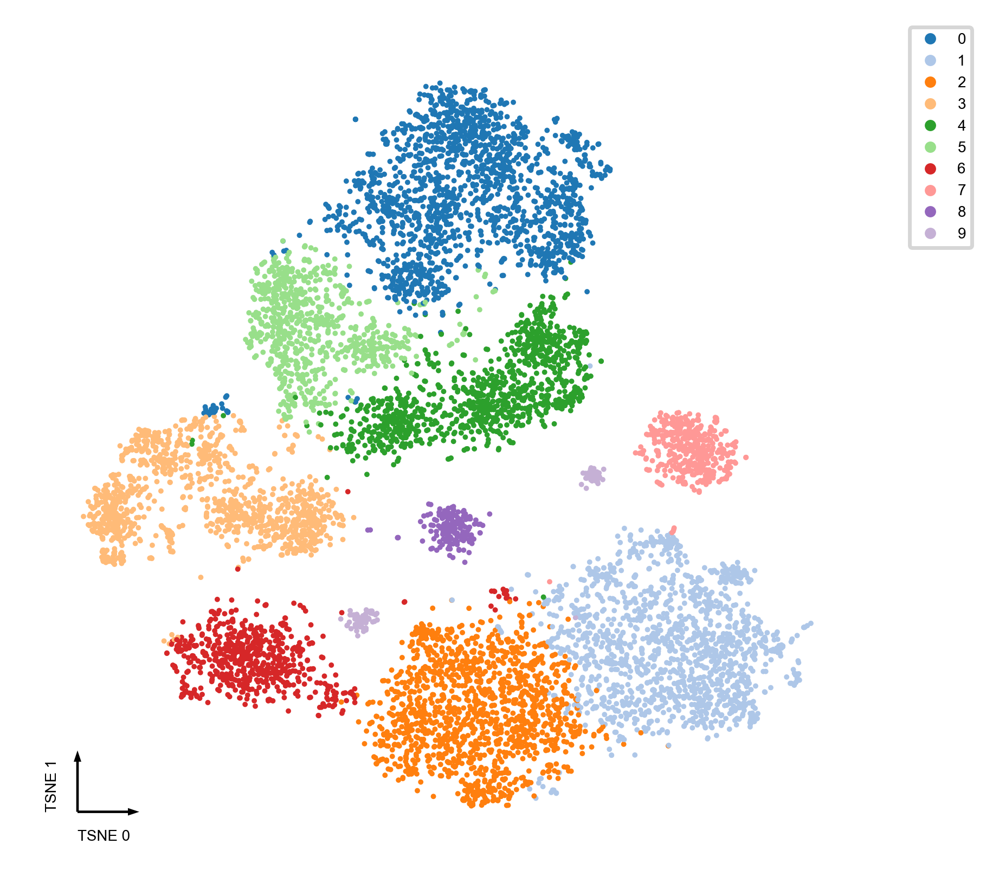

umap


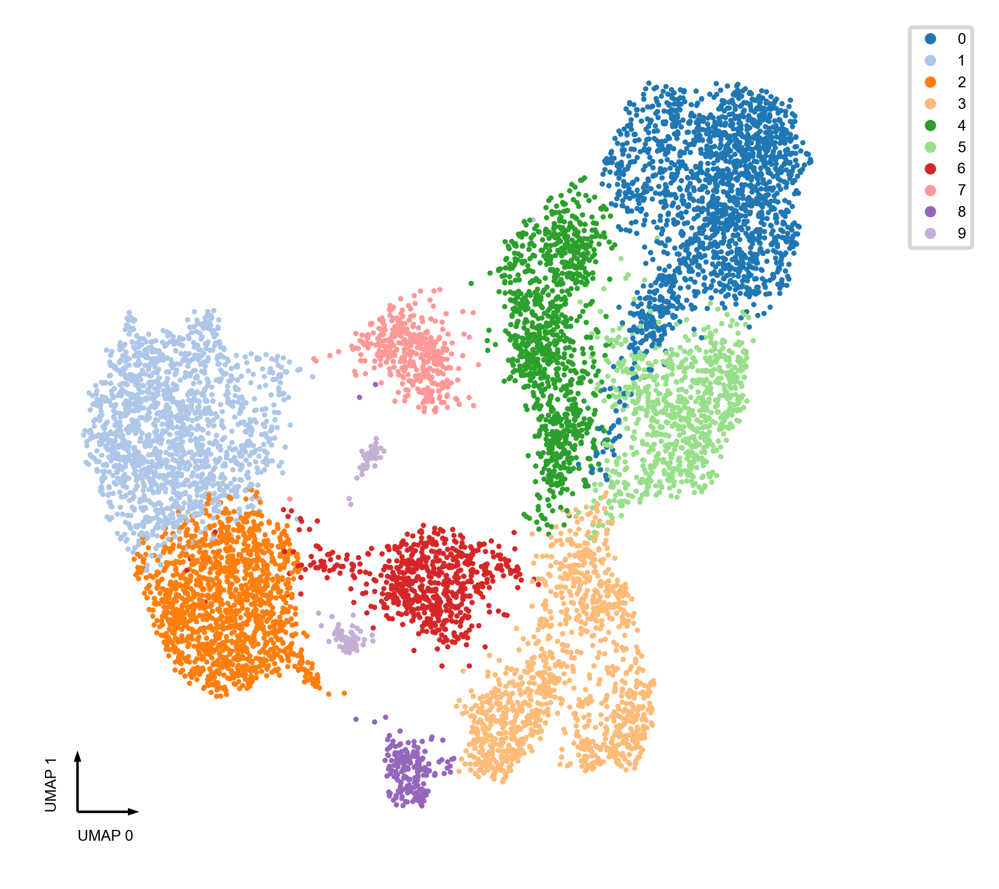

In [14]:
for embedding in ['tsne','umap']:
    if f"X_{embedding}" not in adata.obsm:
        continue
    print(embedding)
    fig, ax = plt.subplots(figsize=(4, 4), dpi=250)
    categorical_scatter(data=adata,
                        ax=ax,coord_base=embedding,hue='leiden',
                        show_legend=True,max_points=None)
    plt.savefig(f"{fig_basename}.concatenated_pcs_leiden.{embedding}.pdf",bbox_inches='tight',dpi=300)
    plt.show()

In [16]:
adata.strings_to_categoricals()
adata.write_h5ad(f"{data_basename}.concatenated_pcs.adata.h5ad") #X is mch_adata.X